In [334]:
import numpy as np
import pandas as pd
import re
import seaborn as sb

In [335]:
#Part1

In [336]:
df=pd.read_json("/Users/Arshi/Desktop/logins.json")

In [337]:
df.describe()

,login_time
count,93142
unique,92265
top,1970-02-12 11:16:53
freq,3
first,1970-01-01 20:12:16
last,1970-04-13 18:57:38


In [338]:
df.shape

(93142, 1)

In [339]:
df["login_time"].dtypes

dtype('<M8[ns]')

In [340]:
df.head()

,login_time
0,1970-01-01 20:13:18
1,1970-01-01 20:16:10
2,1970-01-01 20:16:37
3,1970-01-01 20:16:36
4,1970-01-01 20:26:21


In [341]:
df.tail()

,login_time
93137,1970-04-13 18:50:19
93138,1970-04-13 18:43:56
93139,1970-04-13 18:54:02
93140,1970-04-13 18:57:38
93141,1970-04-13 18:54:23


In [342]:
lst=re.split(" ",str(df.ix[0,0]))

In [343]:
re.split("-",lst[0])

['1970', '01', '01']

In [344]:
re.split(":",lst[1])

['20', '13', '18']

In [345]:
re.split("  \: \-",str(df.ix[0,0]))

['1970-01-01 20:13:18']

In [346]:

df["year"]=df["login_time"].dt.year
df["month"]=df["login_time"].dt.month
df["day"]=df["login_time"].dt.day
df["hour"]=df["login_time"].dt.hour
df["minute"]=df["login_time"].dt.minute
df["second"]=df["login_time"].dt.second



In [347]:
df.head(100)

,login_time,year,month,day,hour,minute,second
0,1970-01-01 20:13:18,1970,1,1,20,13,18
1,1970-01-01 20:16:10,1970,1,1,20,16,10
2,1970-01-01 20:16:37,1970,1,1,20,16,37
3,1970-01-01 20:16:36,1970,1,1,20,16,36
4,1970-01-01 20:26:21,1970,1,1,20,26,21
5,1970-01-01 20:21:41,1970,1,1,20,21,41
6,1970-01-01 20:12:16,1970,1,1,20,12,16
7,1970-01-01 20:35:47,1970,1,1,20,35,47
8,1970-01-01 20:35:38,1970,1,1,20,35,38
9,1970-01-01 20:47:52,1970,1,1,20,47,52


In [348]:
bins = [0, 15, 30, 45, 60]
group_names = [1, 2, 3, 4]

df['categories'] = pd.cut(df['minute'], bins, labels=group_names)

In [349]:
df['categories1']=df['hour']*10 + df['categories']
#df['categories'].astype(int)

/Users/Arshi/anaconda/lib/python3.6/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


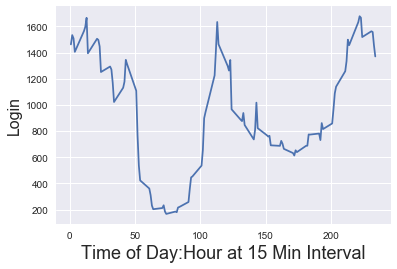

In [350]:
import matplotlib.pyplot as plt

%matplotlib inline
fig = plt.figure()
plt.plot(pd.value_counts(df['categories1']).sort_index())
plt.xlabel('Time of Day:Hour at 15 Min Interval', fontsize=18)
plt.ylabel('Login', fontsize=16)
fig.show()

In [351]:
"""
Observation: 
Number of customer login peaks during late evening - night hours(8pm to 4am) and during early work hours(11 am to 12pm). 
Logins are at their lowest during early morning hours(5am to 10 am).

Deduction: 
Ultimate Technologies is preferred by customers for their leisure tavel and for commute during office hours. 
Not many customers prefer it while arriving to or departing from work.     
"""

'\nObservation: \nNumber of customer login peaks during late evening - night hours(8pm to 4am) and during early work hours(11 am to 12pm). \nLogins are at their lowest during early morning hours(5am to 10 am).\n\nDeduction: \nUltimate Technologies is preferred by customers for their leisure tavel and for commute during office hours. \nNot many customers prefer it while arriving to or departing from work.     \n'

In [352]:
"""
PART 2:

a. Key metric: For each driving partner registered in a city during time period 
    1. Number of intercity rides  
    2. Number of intracity rides 
    3. Time and duration of rides

b. Experiment details

I will choose time period where historically the customer demand pattern remain the same. For e.g. fall season
where conditions for office workers, students and other social segments are similar for the chosen time frame.

I will divide the time period of experiment in two equal halfs. While splitting the time duration care must be taken 
that each window has similar number of work days, weekends and holidays.

In the first half of the time period it will be business as usual with data recorded for number of intra city rides, 
number of inter city rides and time and duration of rides recorded for each driving partner. Also, record of new driving 
partner associated with the firm during this period will be maintained.  

In the second half of the the time period, driving partners will be informed through app or mail that toll 
for every intercity ride will be borne by Ultimate Technology. For this period, record of inter and intra city rides by 
driving partners will be recorded along with time and duration of these rides.

The case can now be treated as an AB test. Comparing individual KPIs using T Test for driving partners.

So we will have two population of registered driving partners in two cities. Their intercity and intracity rides over 
the two time periods will be compared using 2 sample T Test.

Null Hypothesis 1: Aveg number of Intra city rides for city 1 drivers in time period 1 = Aveg number of Intra city rides for city 1 drivers in time period 2
Null Hypothesis 2: Aveg number of Intra city rides for city 2 drivers in time period 1 = Aveg number of Intra city rides for city 2 drivers in time period 2
Null Hypothesis 1: Aveg number of Inter city rides for city 1 drivers in time period 1 = Aveg number of Inter city rides for city 1 drivers in time period 2
Null Hypothesis 1: Aveg number of Inter city rides for city 1 drivers in time period 1 = Aveg number of Inter city rides for city 2 drivers in time period 2

Alternate Hypothesis 1: Aveg number of Intra city rides for city 1 drivers in time period 1 != Aveg number of Intra city rides for city 1 drivers in time period 2
Alternate Hypothesis 2: Aveg number of Intra city rides for city 2 drivers in time period 1 != Aveg number of Intra city rides for city 2 drivers in time period 2
Alternate Hypothesis 1: Aveg number of Inter city rides for city 1 drivers in time period 1 != Aveg number of Inter city rides for city 1 drivers in time period 2
Alternate Hypothesis 1: Aveg number of Inter city rides for city 1 drivers in time period 1 != Aveg number of Inter city rides for city 2 drivers in time period 2

P Value less than 0.05 will indicate we have enough evidence to regect the Null Hypothesis and accept that
our experiment has had an effect. Assumption here is that aveg rides would have increased when the promotion was carrried
out.

Note:

Any test will have to be adjusted for new registered driving partners that joined the firm during promotion time period
as there may be contribute more during the promothin time period. There by skewing the results.

Points on chosing a homogenious time period are highlighted in the paragraph above

A simple trend analysis of time of rides will give information as have the registered drivers picked more rides in 
Gotham at night and Metropolis during the day. 

"""

'\nPART 2:\n\na. Key metric: For each driving partner registered in a city during time period \n    1. Number of intercity rides  \n    2. Number of intracity rides \n    3. Time and duration of rides\n\nb. Experiment details\n\nI will choose time period where historically the customer demand pattern remain the same. For e.g. fall season\nwhere conditions for office workers, students and other social segments are similar for the chosen time frame.\n\nI will divide the time period of experiment in two equal halfs. While splitting the time duration care must be taken \nthat each window has similar number of work days, weekends and holidays.\n\nIn the first half of the time period it will be business as usual with data recorded for number of intra city rides, \nnumber of inter city rides and time and duration of rides recorded for each driving partner. Also, record of new driving \npartner associated with the firm during this period will be maintained.  \n\nIn the second half of the the t

In [353]:
#Part 3

In [354]:
#Importing data

import json

with open("/Users/Arshi/Desktop/ultimate_data_challenge.json") as f:
   data = json.load(f)
print (data)


[{'city': "King's Landing", 'trips_in_first_30_days': 4, 'signup_date': '2014-01-25', 'avg_rating_of_driver': 4.7, 'avg_surge': 1.1, 'last_trip_date': '2014-06-17', 'phone': 'iPhone', 'surge_pct': 15.4, 'ultimate_black_user': True, 'weekday_pct': 46.2, 'avg_dist': 3.67, 'avg_rating_by_driver': 5.0}, {'city': 'Astapor', 'trips_in_first_30_days': 0, 'signup_date': '2014-01-29', 'avg_rating_of_driver': 5.0, 'avg_surge': 1.0, 'last_trip_date': '2014-05-05', 'phone': 'Android', 'surge_pct': 0.0, 'ultimate_black_user': False, 'weekday_pct': 50.0, 'avg_dist': 8.26, 'avg_rating_by_driver': 5.0}, {'city': 'Astapor', 'trips_in_first_30_days': 3, 'signup_date': '2014-01-06', 'avg_rating_of_driver': 4.3, 'avg_surge': 1.0, 'last_trip_date': '2014-01-07', 'phone': 'iPhone', 'surge_pct': 0.0, 'ultimate_black_user': False, 'weekday_pct': 100.0, 'avg_dist': 0.77, 'avg_rating_by_driver': 5.0}, {'city': "King's Landing", 'trips_in_first_30_days': 9, 'signup_date': '2014-01-10', 'avg_rating_of_driver': 4.

In [355]:
#Converting to a dataframe

df1=pd.DataFrame(data)

df1.head()

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,city,last_trip_date,phone,signup_date,surge_pct,trips_in_first_30_days,ultimate_black_user,weekday_pct
0,3.67,5.0,4.7,1.10,King's Landing,2014-06-17,iPhone,2014-01-25,15.4,4,True,46.2
1,8.26,5.0,5.0,1.00,Astapor,2014-05-05,Android,2014-01-29,0.0,0,False,50.0
2,0.77,5.0,4.3,1.00,Astapor,2014-01-07,iPhone,2014-01-06,0.0,3,False,100.0
3,2.36,4.9,4.6,1.14,King's Landing,2014-06-29,iPhone,2014-01-10,20.0,9,True,80.0
4,3.13,4.9,4.4,1.19,Winterfell,2014-03-15,Android,2014-01-27,11.8,14,False,82.4


In [356]:
#Checking discriptive stats of the data

df1.describe()

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,surge_pct,trips_in_first_30_days,weekday_pct
count,50000.000000,49799.000000,41878.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,5.796827,4.778158,4.601559,1.074764,8.849536,2.278200,60.926084
std,5.707357,0.446652,0.617338,0.222336,19.958811,3.792684,37.081503
min,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
25%,2.420000,4.700000,4.300000,1.000000,0.000000,0.000000,33.300000
50%,3.880000,5.000000,4.900000,1.000000,0.000000,1.000000,66.700000
75%,6.940000,5.000000,5.000000,1.050000,8.600000,3.000000,100.000000
max,160.960000,5.000000,5.000000,8.000000,100.000000,125.000000,100.000000


In [357]:
#Checking number of rows and column in data
df1.shape

(50000, 12)

In [358]:
#Checking data type
df1.dtypes

avg_dist                  float64
avg_rating_by_driver      float64
avg_rating_of_driver      float64
avg_surge                 float64
city                       object
last_trip_date             object
phone                      object
signup_date                object
surge_pct                 float64
trips_in_first_30_days      int64
ultimate_black_user          bool
weekday_pct               float64
dtype: object

In [359]:
#Missing values per column
df1.isnull().sum()

avg_dist                     0
avg_rating_by_driver       201
avg_rating_of_driver      8122
avg_surge                    0
city                         0
last_trip_date               0
phone                      396
signup_date                  0
surge_pct                    0
trips_in_first_30_days       0
ultimate_black_user          0
weekday_pct                  0
dtype: int64

In [360]:
#Imputing missing values for avg_rating_by_driver
df1['avg_rating_by_driver'].fillna((df1['avg_rating_by_driver'].mean()), inplace=True)

In [361]:
#Checking categorical data
df1.city.unique()


array(["King's Landing", 'Astapor', 'Winterfell'], dtype=object)

In [362]:
df1.ultimate_black_user.unique()

array([True, False], dtype=object)

In [363]:
#Converting to datetime
df1['last_trip_date'] =  pd.to_datetime(df1['last_trip_date'])

MaxDate=df1["last_trip_date"].max()

for i in range(len(df1)):
    df1.ix[i,"Days_since_last_trip"]=(MaxDate-df1.ix[i,"last_trip_date"]).days


In [364]:
df1.describe()

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,surge_pct,trips_in_first_30_days,weekday_pct,Days_since_last_trip
count,50000.000000,50000.000000,41878.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,5.796827,4.778158,4.601559,1.074764,8.849536,2.278200,60.926084,72.665220
std,5.707357,0.445753,0.617338,0.222336,19.958811,3.792684,37.081503,61.718985
min,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,2.420000,4.700000,4.300000,1.000000,0.000000,0.000000,33.300000,13.000000
50%,3.880000,5.000000,4.900000,1.000000,0.000000,1.000000,66.700000,54.000000
75%,6.940000,5.000000,5.000000,1.050000,8.600000,3.000000,100.000000,137.000000
max,160.960000,5.000000,5.000000,8.000000,100.000000,125.000000,100.000000,181.000000


In [365]:
df1['DepVar'] = df1["Days_since_last_trip"].map(lambda x: 0 if x > 30 else 1) #Churned are tagged as 0
                                                                              #Retained are tagged as 1  

In [366]:
df1['DepVar'].value_counts()

0    31196
1    18804
Name: DepVar, dtype: int64

In [367]:
#One hot encoding

#Generating a new column for ultimate_black_user
df1['UBU'] = df1["ultimate_black_user"].map(lambda x: 1 if x==True else 0) #UltimateBlackUser are tagged as 1
#df1 = df1[np.isfinite(df1['avg_rating_of_driver'])]
df1.dtypes

#Dropping unwanted column
#df1.dtypes
df1.drop('signup_date', axis=1, inplace=True)
df1.drop('phone', axis=1, inplace=True)



In [368]:
df1.head(15)

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,city,last_trip_date,surge_pct,trips_in_first_30_days,ultimate_black_user,weekday_pct,Days_since_last_trip,DepVar,UBU
0,3.67,5.0,4.7,1.10,King's Landing,2014-06-17,15.4,4,True,46.2,14.0,1,1
1,8.26,5.0,5.0,1.00,Astapor,2014-05-05,0.0,0,False,50.0,57.0,0,0
2,0.77,5.0,4.3,1.00,Astapor,2014-01-07,0.0,3,False,100.0,175.0,0,0
3,2.36,4.9,4.6,1.14,King's Landing,2014-06-29,20.0,9,True,80.0,2.0,1,1
4,3.13,4.9,4.4,1.19,Winterfell,2014-03-15,11.8,14,False,82.4,108.0,0,0
5,10.56,5.0,3.5,1.00,Winterfell,2014-06-06,0.0,2,True,100.0,25.0,1,1
6,3.95,4.0,NaN,1.00,Astapor,2014-01-25,0.0,1,False,100.0,157.0,0,0
7,2.04,5.0,5.0,1.00,Winterfell,2014-01-29,0.0,2,False,100.0,153.0,0,0
8,4.36,5.0,4.5,1.00,Winterfell,2014-02-01,0.0,2,False,100.0,150.0,0,0
9,2.37,5.0,NaN,1.00,Winterfell,2014-01-05,0.0,1,False,0.0,177.0,0,0


In [369]:
#One hot encoding for city column
from sklearn import preprocessing
le = preprocessing.LabelEncoder()


for col in df1.columns.values:
       # Encoding only categorical variables
       if df1[col].dtypes=='object':
           # Using whole data to form an exhaustive list of levels
           data=df1[col].append(df1[col])
           le.fit(data.values)
           df1[col]=le.transform(df1[col])
       
"""
King's Landing=1
Astapor=0
Winterfell=2
"""

#Dropping unwanted column
df1.drop('Days_since_last_trip', axis=1, inplace=True)
df1.drop('ultimate_black_user', axis=1, inplace=True)
df1.drop('last_trip_date', axis=1, inplace=True)

In [370]:
df1.head(15)

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,city,surge_pct,trips_in_first_30_days,weekday_pct,DepVar,UBU
0,3.67,5.0,4.7,1.10,1,15.4,4,46.2,1,1
1,8.26,5.0,5.0,1.00,0,0.0,0,50.0,0,0
2,0.77,5.0,4.3,1.00,0,0.0,3,100.0,0,0
3,2.36,4.9,4.6,1.14,1,20.0,9,80.0,1,1
4,3.13,4.9,4.4,1.19,2,11.8,14,82.4,0,0
5,10.56,5.0,3.5,1.00,2,0.0,2,100.0,1,1
6,3.95,4.0,NaN,1.00,0,0.0,1,100.0,0,0
7,2.04,5.0,5.0,1.00,2,0.0,2,100.0,0,0
8,4.36,5.0,4.5,1.00,2,0.0,2,100.0,0,0
9,2.37,5.0,NaN,1.00,2,0.0,1,0.0,0,0


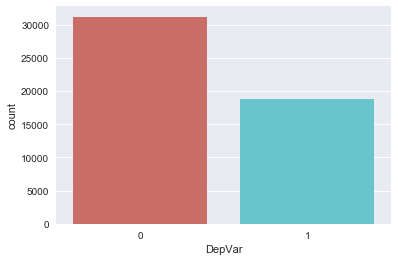

In [371]:
sb.countplot(x='DepVar',data=df1, palette='hls')
#1: Retained
#0: Churned

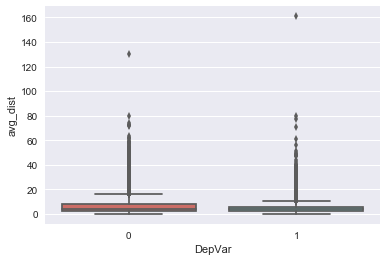

In [372]:
sb.boxplot(x='DepVar', y='avg_dist', data=df1, palette='hls')

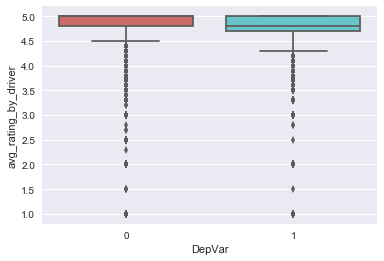

In [373]:
sb.boxplot(x='DepVar', y='avg_rating_by_driver', data=df1, palette='hls')

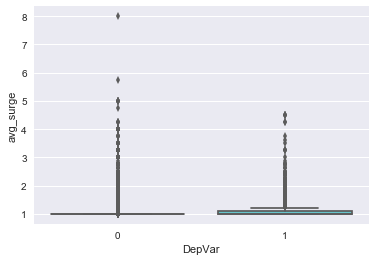

In [374]:
sb.boxplot(x='DepVar', y='avg_surge', data=df1, palette='hls')

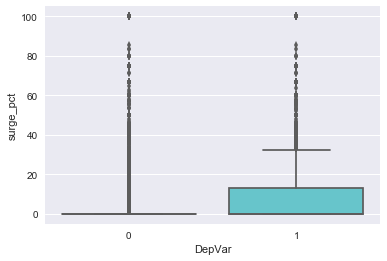

In [375]:
sb.boxplot(x='DepVar', y='surge_pct', data=df1, palette='hls')

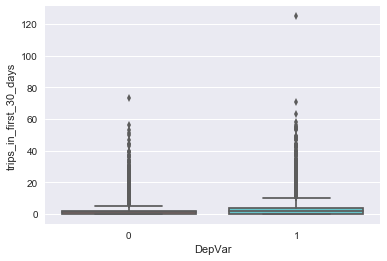

In [376]:
sb.boxplot(x='DepVar', y='trips_in_first_30_days', data=df1, palette='hls')

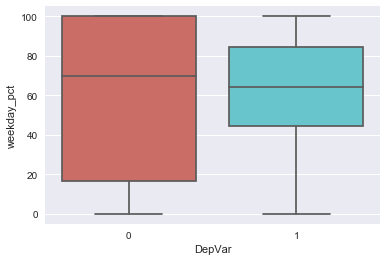

In [377]:
sb.boxplot(x='DepVar', y='weekday_pct', data=df1, palette='hls')

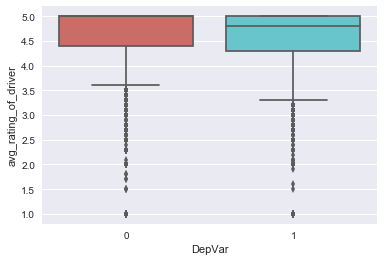

In [378]:
sb.boxplot(x='DepVar', y='avg_rating_of_driver', data=df1, palette='hls')

In [379]:
one_hot=pd.get_dummies(df1["city"])
df1=df1.join(one_hot)

In [380]:
df1.head(5)

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,city,surge_pct,trips_in_first_30_days,weekday_pct,DepVar,UBU,0,1,2
0,3.67,5.0,4.7,1.10,1,15.4,4,46.2,1,1,0,1,0
1,8.26,5.0,5.0,1.00,0,0.0,0,50.0,0,0,1,0,0
2,0.77,5.0,4.3,1.00,0,0.0,3,100.0,0,0,1,0,0
3,2.36,4.9,4.6,1.14,1,20.0,9,80.0,1,1,0,1,0
4,3.13,4.9,4.4,1.19,2,11.8,14,82.4,0,0,0,0,1


In [381]:
#Renaming columns 0, 1 and 2 with Astapor, KingLanding and Winterfell

df1 = df1.rename(columns={0: 'Astapor', 1: 'KingLanding', 2: 'Winterfell'})

In [382]:
df1.head(5)

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,city,surge_pct,trips_in_first_30_days,weekday_pct,DepVar,UBU,Astapor,KingLanding,Winterfell
0,3.67,5.0,4.7,1.10,1,15.4,4,46.2,1,1,0,1,0
1,8.26,5.0,5.0,1.00,0,0.0,0,50.0,0,0,1,0,0
2,0.77,5.0,4.3,1.00,0,0.0,3,100.0,0,0,1,0,0
3,2.36,4.9,4.6,1.14,1,20.0,9,80.0,1,1,0,1,0
4,3.13,4.9,4.4,1.19,2,11.8,14,82.4,0,0,0,0,1


In [383]:
#Dropping columns City and Astapor to avoid multi collinearity
df1.drop('city', axis=1, inplace=True)
df1.drop('Astapor', axis=1, inplace=True)
#Dropping avg_rating_of_driver as more than 10% data is missing
df1.drop('avg_rating_of_driver', axis=1, inplace=True)

In [384]:
df1.head(5)

,avg_dist,avg_rating_by_driver,avg_surge,surge_pct,trips_in_first_30_days,weekday_pct,DepVar,UBU,KingLanding,Winterfell
0,3.67,5.0,1.10,15.4,4,46.2,1,1,1,0
1,8.26,5.0,1.00,0.0,0,50.0,0,0,0,0
2,0.77,5.0,1.00,0.0,3,100.0,0,0,0,0
3,2.36,4.9,1.14,20.0,9,80.0,1,1,1,0
4,3.13,4.9,1.19,11.8,14,82.4,0,0,0,1


In [385]:
df1.shape

(50000, 10)

In [386]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV

In [387]:
#Split data into test and train set at 80:20
X=df1.drop('DepVar', axis=1)
XTrain, XTest, YTrain, YTest = train_test_split(X,(df1.DepVar==1).values,test_size=0.20, random_state=10)

In [388]:
#Checking shape of test and train data set
print(XTrain.shape)
print(XTest.shape)
print(YTrain.shape)
print(YTest.shape)


(40000, 9)
(10000, 9)
(40000,)
(10000,)


In [389]:
#Implementing CV and performance tuning
parameters = {"C":[0.001,0.01,0.1,1,10,50,100,1000]}
clf = LogisticRegression()
clf_Grid_Search = GridSearchCV(clf, parameters, cv=5, scoring = "accuracy")
clf_Grid_Search.fit(XTrain,YTrain)

GridSearchCV(cv=5, error_score='raise',
       estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 50, 100, 1000]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='accuracy', verbose=0)

In [390]:
#Best value of C
clf_Grid_Search.best_params_

{'C': 10}

In [391]:
#Performance on Training Set
accuracy_score(clf_Grid_Search.predict(XTrain),YTrain)

0.70445000000000002

In [392]:
#Performance on Test Set
accuracy_score(clf_Grid_Search.predict(XTest),YTest)

0.70530000000000004

In [393]:
#Forming a new model with selected C
m = LogisticRegression(C=10)
m.fit(XTrain, YTrain)

LogisticRegression(C=10, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [394]:
print(m.coef_)

[[ -3.75607653e-02  -1.59289803e-01  -1.70277464e-01   4.51677938e-03
    1.23125859e-01   3.61901983e-05   8.88782887e-01   1.70678688e+00
    5.05001841e-01]]


In [395]:
XTrain.dtypes

avg_dist                  float64
avg_rating_by_driver      float64
avg_surge                 float64
surge_pct                 float64
trips_in_first_30_days      int64
weekday_pct               float64
UBU                         int64
KingLanding                 uint8
Winterfell                  uint8
dtype: object

In [396]:
YPred = m.predict(XTest)

In [397]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(YTest, YPred)
confusion_matrix

array([[5355,  841],
       [2106, 1698]])

In [398]:
accuracy_score(YPred,YTest)

0.70530000000000004

In [399]:
"""
a. Fraction of user retained
Retained 100% data, removed the column avg_rating_of_driver as it had more than 10% data missing.
Ran an iteration on the data with avg_rating_of_driver included....it reduced the overall accuracy to 0.68433619866284623

b. Logistic regression is the model chosen. This will allow binary classification and will also allow interpretation 
of the variables.
Accuracy measure chosen are overall accuracy and confusion matrix.

Key indicators and insights:

Higher the Avg Surge lower is the retention
Customers who used ultimate black in the first 30 days tend to remain with the firm
Higher number of trips taken in the first 30 days indicate better chances of retention
Customers of King's Landing tend to stick with firm more than those from Winterfell and Astapor(in that order)

"""

'\na. Fraction of user retained\nRetained 100% data, removed the column avg_rating_by_driver\n0.68433619866284623\n'